# HatLab Parameters
Generating Fidelity Landscapes over the variables ramp_coef and offset and NOT distance using the HatLab experimental parameters.

$\alpha = 4.54 \, \text{GHz}$

$\delta = -190 \, \text{MHz}$

We turn $\delta$ and $\alpha$ from frequencies to angular frequencies. Additionally, our amplitude is now also angular.

In [5]:
import sys
sys.path.append("..")
import importlib
import numpy as np
import matplotlib.pyplot as plt
import qutip

import system.theoretical2pi as system
importlib.reload(system)
import utils.solver as solver
importlib.reload(solver)
import pulse.tukey as pulse_gen
importlib.reload(pulse_gen)
import utils.expectation_values as expect
importlib.reload(expect)

pass

In [6]:
from qutip.parallel import parallel_map as parallel_map
from qutip.parallel import parfor as parfor
from tqdm import tqdm
all_results = []
_amp = 2.3 * 2 * np.pi
_off = 0
_dur = 25
_ramp = 0.2

In [9]:
def run_once(ramp):
    global _amp, _off, _dur
    tlist = np.linspace(0, _dur, int(_dur*2))
    pulse_gen.setup(amplitude=_amp, drive_frequency= system.first_energy_spacing/3 - _off, ramp_coef=ramp, tlist=tlist)
    solution = solver.time_evolve(H_d=system.H0, H_c=system.H1, pertubation_func=pulse_gen.pulse_func, tlist=tlist, starting_state=system.basis_states[0], pbar=False)
    expectation_values = expect.get_all_expectation_values(solution.states, system.basis_states)
    return {
        "fidelity": expectation_values[1][-1],
        "offset": _off,
        "frequency":  system.first_energy_spacing/3 - _off,
        "duration": _dur,
        "ramp": ramp
        "amplitude": _amp
    }

SyntaxError: invalid syntax (2947465005.py, line 12)

## Solve over many V0s

In [36]:
_results = []

In [3]:
def generate_fidelity_landscape(amplitude, center_offset, duration=200, offset_bounds=0.05, fine=False):
    global _results, _amp, _off, _ramp, _dur
    if fine:
        # fine grain
        offset_iterations = 100
        ramp_iterations = 50
    else:
        # coarse grain
        offset_iterations = 35
        ramp_iterations = 15
    offs = np.linspace(center_offset-offset_bounds, center_offset+offset_bounds, offset_iterations)
    for i in tqdm(range(0, offset_iterations)):
        off = offs[i]
        already_did_this_offset = False
        for result in _results:
            if result["amplitude"] == amplitude and result["offset"] == off:
                already_did_this_offset = True
        if already_did_this_offset:
            break
        # set params for run_once
        _amp = amplitude
        _off = off
        _dur = duration
        ramps = np.linspace(0, 1, ramp_iterations)
        _results += parallel_map(run_once, ramps)

In [4]:
generate_fidelity_landscape(2.3*2*np.pi, 0.16, fine=False)

NameError: name 'tqdm' is not defined

In [74]:
import utils.saver as saver

saver.save(_results, "landscapes_truncated_with2pi")

# Graph all Fidelity Landscapes

{13.194689145077131, 11.309733552923255, 10.681415022205297, 11.938052083641214, 12.566370614359172, 13.823007675795091, 14.451326206513047, 15.707963267948966, 16.336281798666924, 16.964600329384883, 18.2212373908208, 17.59291886010284, 18.84955592153876, 21.991148575128552, 19.477874452256717, 20.106192982974676, 15.079644737231007}


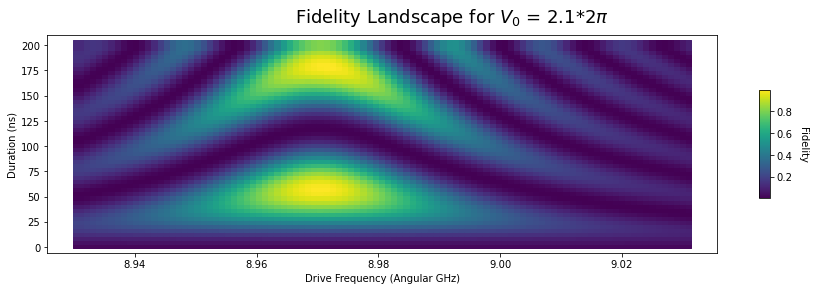

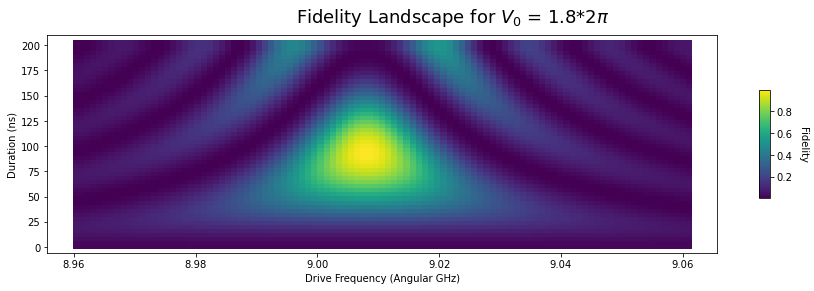

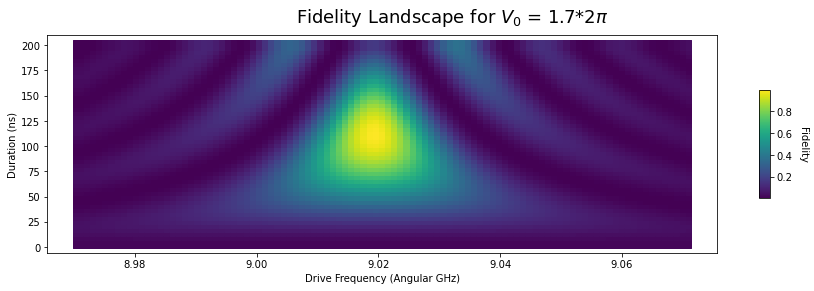

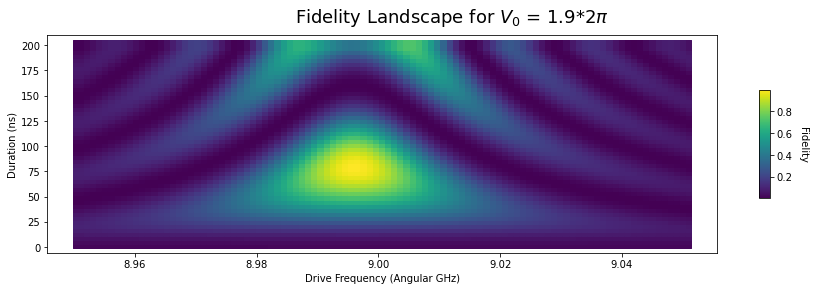

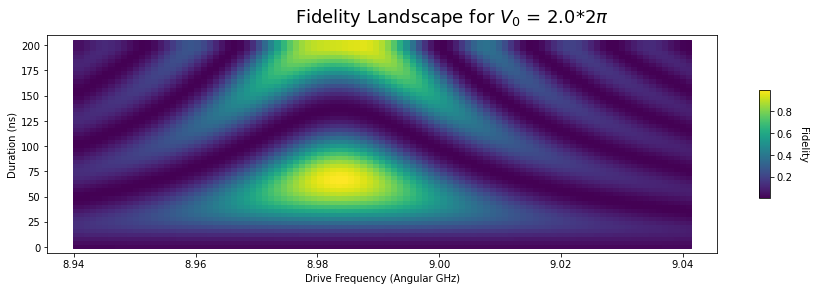

...

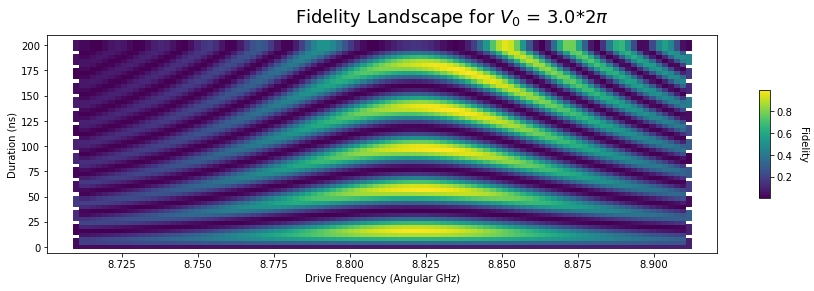

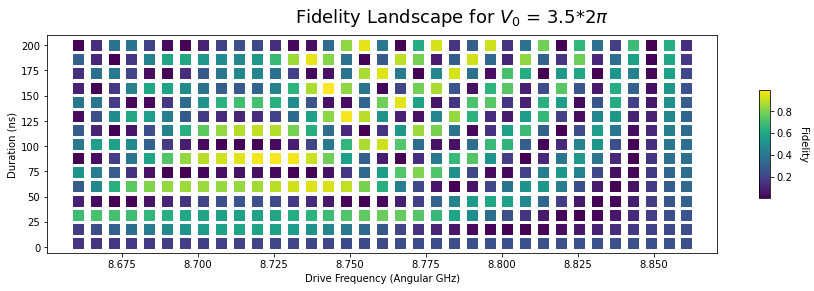

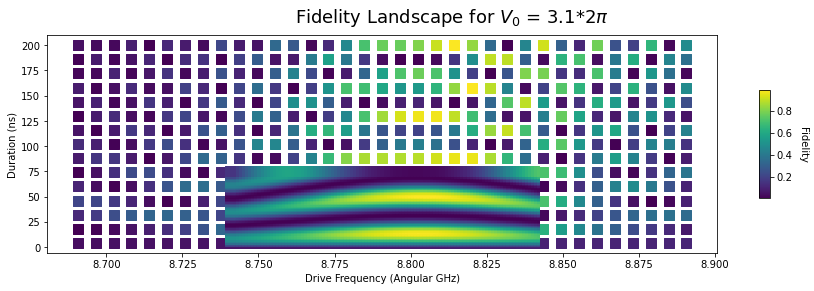

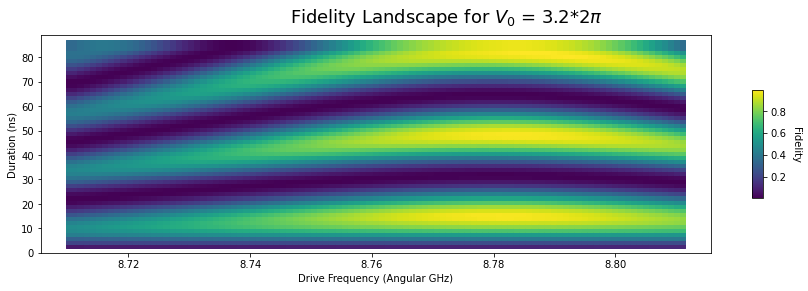

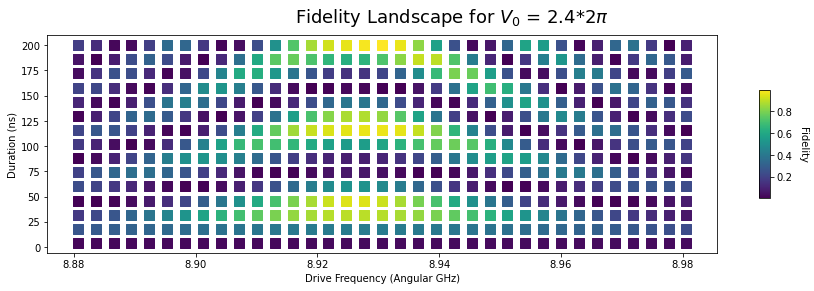

In [79]:
import copy
# %matplotlib widget

amps = []
offs = []
durs = []
fids = []
freqs = []
all_results_to_graph = copy.deepcopy(_results)
for result in all_results_to_graph:
    amps.append(result["amplitude"])
meta_amps = set(amps)
print(meta_amps)

for amp in meta_amps:
    offs = []
    durs = []
    fids = []
    freqs = []
    for result in all_results_to_graph:
        # print(result["amplitude"])
        # print(amp)
        # input()
        if result["amplitude"] == amp:
            offs.append(result["offset"])
            durs.append(result["duration"])
            fids.append(result["fidelity"])
            freqs.append(result["frequency"])
    fig, axs = plt.subplots(figsize=(15, 4))
    fig.suptitle("Fidelity Landscape for $V_0$ = %.1f$ * 2\pi$" % (amp/(2*np.pi)), fontsize=18)
    axs.set_xlabel("Drive Frequency (Angular GHz)")
    axs.set_ylabel("Duration (ns)")
    surf = axs.scatter(freqs, durs, c=fids, cmap="viridis", marker="s", s=100)
    cbar = fig.colorbar(surf, shrink=0.5, aspect=10)
    cbar.ax.set_ylabel("Fidelity", rotation=270)
    cbar.ax.get_yaxis().labelpad = 15
    plt.plot()
# axs.pcolormesh(offs, durs, fids)


# from matplotlib import pyplot as plt
# from matplotlib import animation

# # meta_amps = [2.5, 2.6, 2.7, ...]

# import copy

# meta_amps =[]
# for result in all_results_to_graph:
#     meta_amps.append(result["amplitude"])
# meta_amps = set(meta_amps)
# print(meta_amps)
# # fig, axs = plt.subplots(figsize=(15, 4))
# # fig.suptitle("Fidelity Landscape for $V_0$ = %.1f$ * 2\pi$" % (amps[-1]/(2*np.pi)), fontsize=18)
# # axs.set_xlabel("Drive Frequency (Angular GHz)")
# # axs.set_ylabel("Duration (ns)")
# # surf = axs.scatter(freqs, durs, c=fids, cmap="viridis", marker="s", s=10)
# # cbar = fig.colorbar(surf, shrink=0.5, aspect=10)
# # cbar.ax.set_ylabel("Fidelity", rotation=270)
# # cbar.ax.get_yaxis().labelpad = 15
# # # axs.pcolormesh(offs, durs, fids)

# fig = plt.figure()

# points = plt.scatter([],[], s=100)

# def init():
#     return points

# def animate(i):
#     #i is index of amp
#     amp = meta_amps[i]
#     fig.suptitle("Fidelity Landscape for $V_0$ = %.1f$ * 2\pi$" % (amp/(2*np.pi)), fontsize=18)

#     offs = []
#     durs = []
#     fids = []
#     freqs = []
#     for result in all_results_to_graph:
#         if result["amplitude"] == amp:
#             offs.append(result["offset"])
#             durs.append(result["duration"])
#             fids.append(result["fidelity"])
#             freqs.append(result["frequency"])

#     points = plt.scatter(freqs, durs, c=fids, marker="s", s=100)

#     return points #return everything that must be updated

# anim = animation.FuncAnimation(fig, animate, init_func=init,
#                                frames=100, interval=20, blit=True)

# plt.show()

# Try Full Cosine

In [68]:
import system.theoretical2piReverted as system # change system to full cosine system we reverted back to
importlib.reload(system)

<module 'system.theoretical2piReverted' from '../system/theoretical2piReverted.py'>

In [41]:
all_results2 = []

In [64]:
iterations = 100
for i in tqdm(range(0, iterations)):
    _off = np.linspace(0.1, 0.3, iterations)[i]
    already_did_this_offset = False
    for result in all_results2:
        if result["offset"] == _off:
            already_did_this_offset = True
            break
    if already_did_this_offset:
        continue

    all_results2 += parallel_map(run_once, np.linspace(4, 200, 20)) # durations here

100%|██████████| 100/100 [10:04<00:00,  6.05s/it]


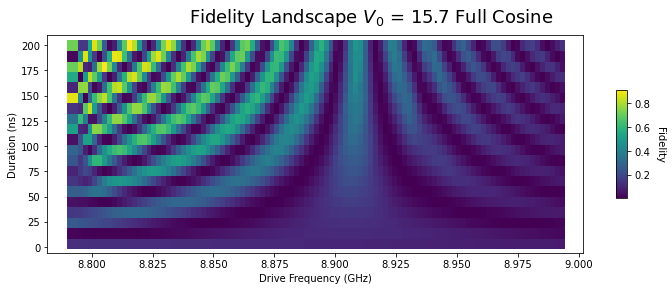

In [65]:
import copy
# %matplotlib widget

amps = []
offs = []
durs = []
fids = []
freqs = []
all_results_to_graph = copy.deepcopy(all_results2)
for result in all_results_to_graph:
    amps.append(result["amplitude"])
    offs.append(result["offset"])
    durs.append(result["duration"])
    fids.append(result["fidelity"])
    result["frequency"] = system.first_energy_spacing/3 - result["offset"]
    freqs.append(result["frequency"])


fig, axs = plt.subplots(figsize=(12, 4))
fig.suptitle("Fidelity Landscape $V_0$ = %.1f Full Cosine" % amps[-1], fontsize=18)
axs.set_xlabel("Drive Frequency (GHz)")
axs.set_ylabel("Duration (ns)")
surf = axs.scatter(freqs, durs, c=fids, cmap=None, marker="s", s=100)
cbar = fig.colorbar(surf, shrink=0.5, aspect=10)
cbar.ax.set_ylabel("Fidelity", rotation=270)
cbar.ax.get_yaxis().labelpad = 15
# axs.pcolormesh(offs, durs, fids)

In [44]:
import utils.saver as saver

saver.save(all_results2, "theoretical_landscape_2-5_fullcosine_no2pi")